# Módulo 2 - EDA

## Objetivos

## Librerías

In [1]:
# Utils
from pprint import pprint
import os
from collections import Counter
import random


# Data loading and manipulation
import numpy as np
import kagglehub
import pandas as pd

# Image visualization and manipulation
import cv2 as cv


# Visualizations
import seaborn as sns
import matplotlib.pyplot as plt

/home/druiz35/Documents/SEpsilon/SEpsilon-Proyectos/AI-ML-Data/RNABI2025-1-Equipo3/Trabajo3/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Cargado de datos

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arafatsahinafridi/multi-class-driver-behavior-image-dataset") + "/Multi-Class Driver Behavior Image Dataset"

print("Path to dataset files:", path)

Path to dataset files: /home/druiz35/.cache/kagglehub/datasets/arafatsahinafridi/multi-class-driver-behavior-image-dataset/versions/1/Multi-Class Driver Behavior Image Dataset


## Análisis de labels

### Paths de imágenes para cada label

In [3]:
info_clases = { 
    "other_activities": {},
    "safe_driving": {},
    "talking_phone": {},
    "texting_phone": {},
    "turning": {}
}

total_count = 0
for clase in info_clases.keys():
    path_clase = path + f"/{clase}"
    info_clases[clase]["path"] = path_clase
    
    count_clase = len(os.listdir(path_clase))
    total_count += count_clase
    info_clases[clase]["count"] = count_clase


pprint(info_clases)


{'other_activities': {'count': 1184,
                      'path': '/home/druiz35/.cache/kagglehub/datasets/arafatsahinafridi/multi-class-driver-behavior-image-dataset/versions/1/Multi-Class '
                              'Driver Behavior Image Dataset/other_activities'},
 'safe_driving': {'count': 1679,
                  'path': '/home/druiz35/.cache/kagglehub/datasets/arafatsahinafridi/multi-class-driver-behavior-image-dataset/versions/1/Multi-Class '
                          'Driver Behavior Image Dataset/safe_driving'},
 'talking_phone': {'count': 1513,
                   'path': '/home/druiz35/.cache/kagglehub/datasets/arafatsahinafridi/multi-class-driver-behavior-image-dataset/versions/1/Multi-Class '
                           'Driver Behavior Image Dataset/talking_phone'},
 'texting_phone': {'count': 1561,
                   'path': '/home/druiz35/.cache/kagglehub/datasets/arafatsahinafridi/multi-class-driver-behavior-image-dataset/versions/1/Multi-Class '
                   

### Balance de clases

In [4]:
for clase, values in info_clases.items():
    print(f"{clase}:")
    print(values["count"]/total_count * 100)
    print("\n")

other_activities:
16.272677295217154


safe_driving:
23.07586586036284


talking_phone:
20.794392523364486


texting_phone:
21.45409565695437


turning:
18.402968664101156




## Análisis de imágenes

### Mostrar 10 imágenes aleatorias por clase

In [5]:
i = 0

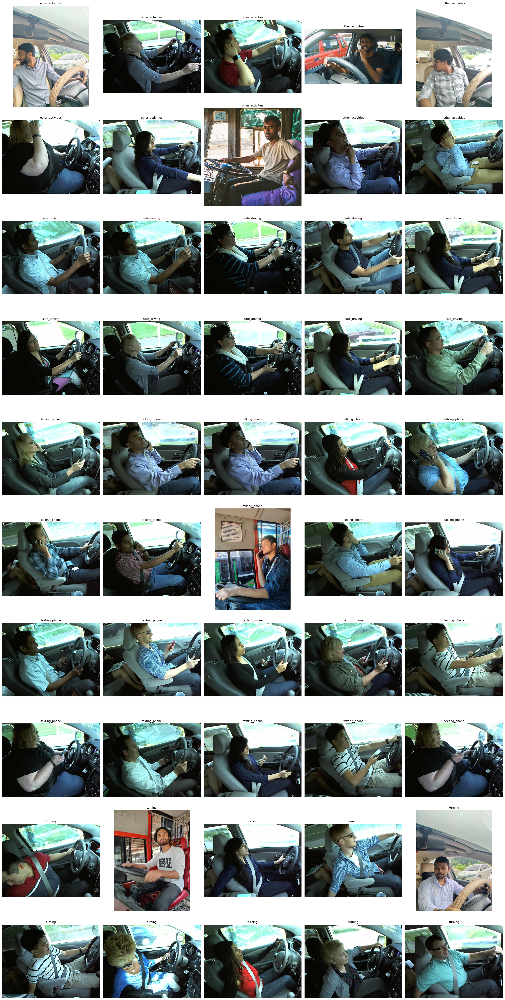

In [11]:
total_count = 0
all_images = []
for clase in info_clases.keys():
    path_clase = path + f"/{clase}"
    info_clases[clase]["path"] = path_clase
    
    image_list = sorted(os.listdir(path_clase))
    count_clase = len(image_list)
    info_clases[clase]["count"] = count_clase
    total_count += count_clase

    num_samples = min(10, len(image_list))
    selected_images = random.sample(image_list, num_samples)
    selected_paths = [os.path.join(path_clase, img_name) for img_name in selected_images]
    
    for img_path in selected_paths:
        all_images.append((img_path, clase))

cols = 5
rows = (len(all_images) + cols - 1) // cols

plt.figure(figsize=(cols * 5, rows * 5))
for idx, (img_path, clase) in enumerate(all_images):
    img = cv.imread(str(img_path))
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    plt.subplot(rows, cols, idx + 1)
    plt.imshow(img)
    plt.title(clase, fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.savefig(f"image_set_{i}.png")
plt.show()
i += 1

### Análisis de dimensiones de imágenes

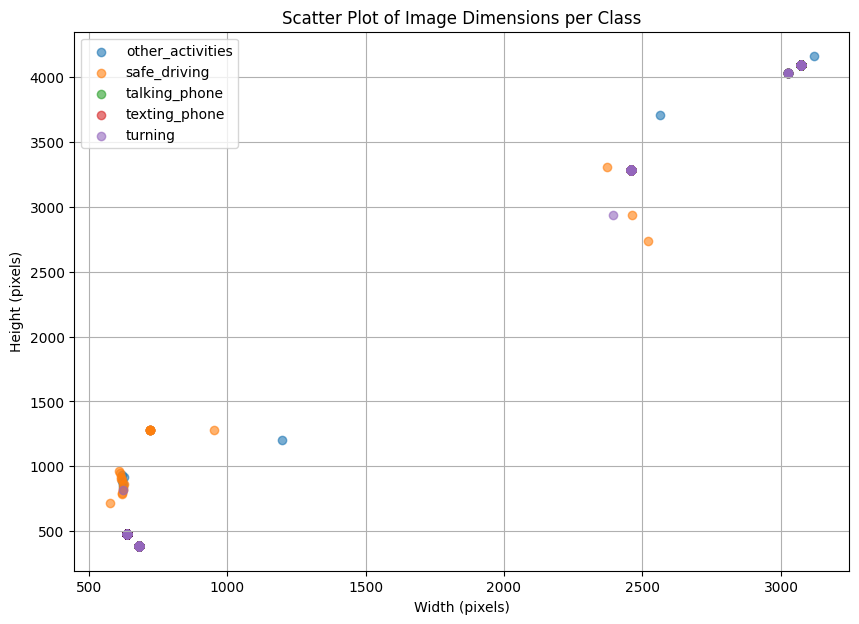

In [7]:
image_shapes = {}

for clase in info_clases.keys():
    path_clase = path + f"/{clase}"
    image_list = os.listdir(path_clase)

    dims = []
    for img_file in image_list:
        img_path = os.path.join(path_clase, img_file)
        img = cv.imread(img_path)
        if img is not None:
            h, w = img.shape[:2]
            dims.append((w, h))

    image_shapes[clase] = dims

plt.figure(figsize=(10, 7))

colors = plt.cm.tab10.colors  # Up to 10 different colors
for idx, (clase, dims) in enumerate(image_shapes.items()):
    widths, heights = zip(*dims)
    plt.scatter(widths, heights, label=clase, alpha=0.6, color=colors[idx % len(colors)])

plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.title("Scatter Plot of Image Dimensions per Class")
plt.legend()
plt.grid(True)
plt.show()


### Calidad de las imágenes
- La calidad es buena para la mayoría de las imágenes.
- Hay algunas imágenes en vertical, pero la mayoría son en horizontal.
- Hay unas cuantas imágenes enormes.
- Hay algunos coches y otros buses. Puede que esto cause problema ahora…
- Hay algunas imágenes que tienen un pasajero en la parte de atrás.
- Hay algunas imágenes que tienen un plano lateral, otros frontales.
- Hay personas de distintas contexturas.
- Llevan todos prendan distintas y con colores variados. Puede que preprocesar las imágenes pasándolas a blanco y negro podría servir.
- Hay varias imágenes clasificadas como other_activities que parecen de otras categorías (safe_driving, turning). Puede que esto cause problemas luego…
- Hay otras actividades como rascarse los ojos, tomar café, rascarse, estirarse para alcanzar algo, etc.

## Conclusiones finales

* Las clases están relativamente balanceadas, pero hay algunas imágenes en other_activities que creemos que podrían causar problemas en el rendimiento del modelo.
* Todas las imágenes parecen tener buena calidad.
* Hay colores variables por cada imagen, así que sería bueno pasar todo a tonos de grises para evitar que el modelo aprenda patrones a partir de los colores.
* Hay pocas imágenes con dimensiones mayores a 2000px, por lo que se podrían tratar o eliminar.